In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
#import the required libraries
from tensorflow.keras import models, layers
import matplotlib.pyplot as plt
import tensorflow as tf
import numpy
import os
os.environ["KMP_DUPLICATE_LIB_OK"]="TRUE"

In [ ]:
#defining  important the attributes
IMAGE_SIZE=224
CHANNELS=3
BATCH_SIZE=32
EPOCHS=35
dataset = '/content/drive/MyDrive/ds/augmented_dataset/'


In [ ]:
# verify classes are balanced
def count_images(directory):
    image_count = 0
    for filename in os.listdir(directory):
        img_path = os.path.join(directory, filename)
        if os.path.isfile(img_path) and filename.lower().endswith(('.png', '.jpg', '.jpeg')):
            image_count += 1
    return image_count

# Loop through each class (subdirectory) in the dataset directory
for subdir in os.listdir(dataset):
    class_dir = os.path.join(dataset, subdir)

    # Check if it's a directory
    if os.path.isdir(class_dir):
        # Count the number of images in this class directory
        image_count = count_images(class_dir)
        print(f"Class {subdir}: {image_count} images")
    else:
        print(f"{subdir} is not a directory.")

Class storagetanks: 210 images
Class river: 210 images
Class mediumresidential: 210 images
Class buildings: 210 images
Class mobilehomepark: 210 images
Class tenniscourt: 210 images
Class baseballdiamond: 210 images
Class intersection: 210 images
Class parkinglot: 210 images
Class agricultural: 210 images
Class freeway: 210 images
Class runway: 210 images
Class harbor: 210 images
Class sparseresidential: 210 images
Class denseresidential: 210 images
Class forest: 210 images
Class beach: 210 images
Class overpass: 210 images
Class airplane: 210 images
Class golfcourse: 210 images
Class chaparral: 210 images


In [ ]:
dataset = tf.keras.preprocessing.image_dataset_from_directory(
    '/content/drive/MyDrive/ds/augmented_dataset/',
    shuffle=True,
    image_size=(IMAGE_SIZE, IMAGE_SIZE),
    batch_size=BATCH_SIZE
)

Found 4410 files belonging to 21 classes.


In [ ]:
landuse_class_names = dataset.class_names
landuse_class_names

['agricultural',
 'airplane',
 'baseballdiamond',
 'beach',
 'buildings',
 'chaparral',
 'denseresidential',
 'forest',
 'freeway',
 'golfcourse',
 'harbor',
 'intersection',
 'mediumresidential',
 'mobilehomepark',
 'overpass',
 'parkinglot',
 'river',
 'runway',
 'sparseresidential',
 'storagetanks',
 'tenniscourt']

In [ ]:
for image_batch, label_batch in dataset.take(1):
    print(image_batch[0].shape)

(224, 224, 3)


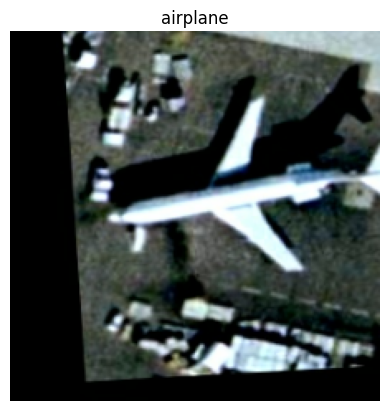

In [ ]:
for image_batch, label_batch in dataset.take(1):
    plt.imshow(image_batch[0].numpy().astype("uint8"))
    plt.title(landuse_class_names[label_batch[0]])
    plt.axis("off")

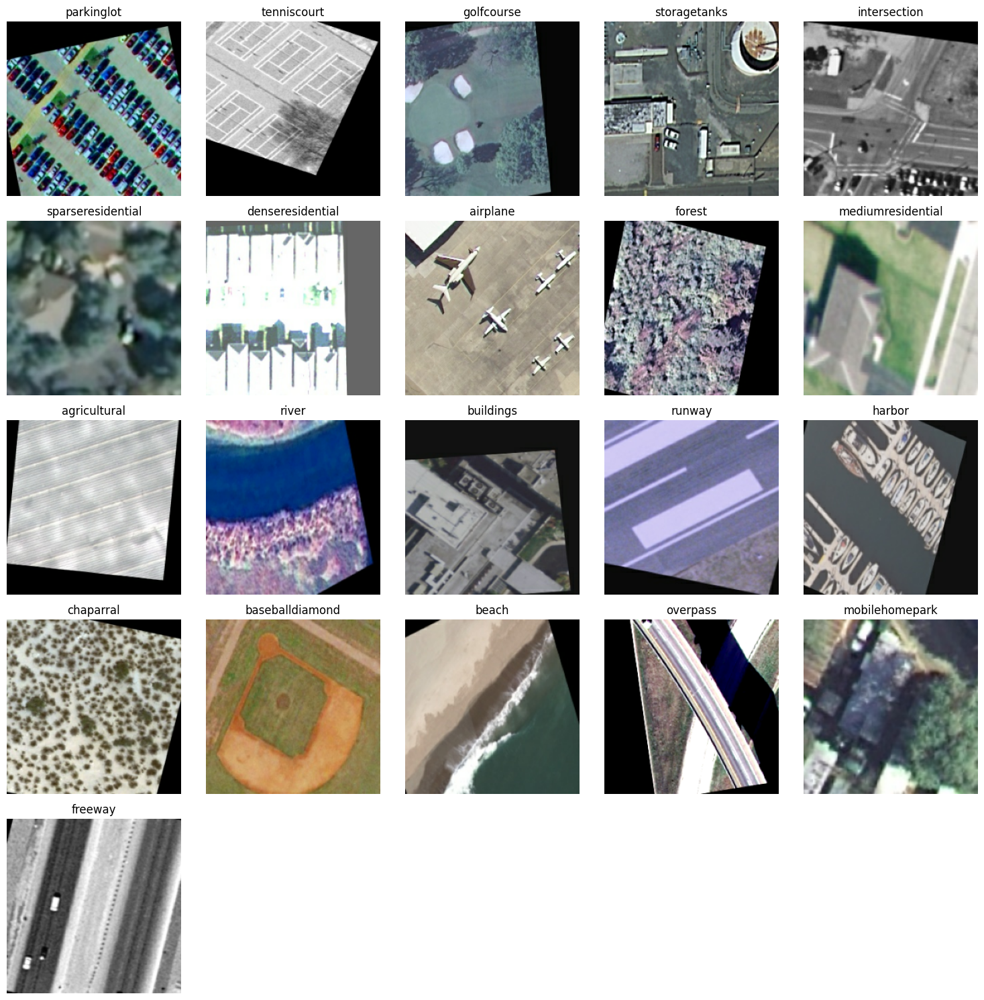

In [ ]:
# Extract class names from the dataset
class_names = dataset.class_names

# Prepare to display one image per class
plt.figure(figsize=(15, 15))

# Dictionary to store the first image path per class
class_first_image_paths = {}

# Iterate over the dataset to find and display the first image from each class
for images, labels in dataset:
    for image, label in zip(images, labels):
        class_name = class_names[label.numpy()]  # Get the class name from the label
        if class_name not in class_first_image_paths:
            # Store the path of the first image encountered for this class
            class_first_image_paths[class_name] = image
            # Display the first image found for this class
            plt.subplot(5, 5, len(class_first_image_paths))  # Adjust subplot position dynamically
            plt.imshow(image.numpy().astype("uint8"))
            plt.title(class_name)
            plt.axis("off")

        # Break loop if we have found one image per class
        if len(class_first_image_paths) == len(class_names):
            break

    # Break outer loop if we have found one image per class
    if len(class_first_image_paths) == len(class_names):
        break

plt.tight_layout()  # Adjust subplot layout to prevent overlap
plt.show()

In [ ]:
# function to split DS
def get_dataset_partitions_tf(ds, train_split=0.7, val_split=0.2 ,test_split=0.1, shuffle=True, shuffle_size=10000):

    ds_size = len(ds)

    if shuffle:
        ds = ds.shuffle(shuffle_size, seed=12)

    train_size = int(train_split*ds_size)
    val_size = int(val_split*ds_size)

    train_data_s = ds.take(train_size)
    val_data_s = ds.skip(train_size).take(val_size)
    test_data_s = ds.skip(train_size).skip(val_size)

    return train_data_s, val_data_s, test_data_s

train_data_s, val_data_s, test_data_s = get_dataset_partitions_tf(dataset)

In [ ]:
len(train_data_s)

96

In [ ]:
len(val_data_s)

27

In [ ]:
len(test_data_s)

15

In [ ]:
train_data_s = train_data_s.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)
val_data_s = val_data_s.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)
test_data_s = test_data_s.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)

In [ ]:
# resize_and_rescale = tf.keras.Sequential([
#     layers.experimental.preprocessing.Resizing(IMAGE_SIZE,IMAGE_SIZE),
#      layers.experimental.preprocessing.Rescaling(1.0/255)
# ]
# )

**MODEL ARCHITECTU**RE

**VGG16 OPTION**

In [ ]:
from tensorflow.keras.applications import VGG16
from tensorflow.keras import layers, models

# Define input shape and number of classes
input_shape = (224, 224, 3)  # Image size: 224x224 pixels with 3 color channels (RGB)
num_classes = 21  # VGG16 was originally trained on ImageNet dataset with 1000 classes

# Load pre-trained VGG16 model
pretrained_model = VGG16(weights='imagenet', include_top=False, input_shape=input_shape)

# Freeze convolutional layers
for layer in pretrained_model.layers:
    layer.trainable = False

# Add custom dense layers for your task
x = layers.Flatten()(pretrained_model.output)
x = layers.Dense(1024, activation='relu')(x)
x = layers.Dense(num_classes, activation='softmax')(x)

# Create a new model
model = models.Model(inputs=pretrained_model.input, outputs=x)

# Print model summary
model.summary()


Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0   

In [ ]:
model.compile(
    optimizer='adam',
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
    metrics=['accuracy']
)

In [ ]:
history = model.fit(
    train_data_s,
    epochs=50,
    batch_size=BATCH_SIZE,
    verbose=1,
    validation_data=val_data_s
)

Epoch 1/50
96/96 [==============================] - 47s 326ms/step - loss: 8.2983 - accuracy: 0.7211 - val_loss: 0.6213 - val_accuracy: 0.9317
Epoch 2/50
96/96 [==============================] - 17s 175ms/step - loss: 0.2334 - accuracy: 0.9635 - val_loss: 0.2887 - val_accuracy: 0.9653
Epoch 3/50
96/96 [==============================] - 17s 177ms/step - loss: 0.1033 - accuracy: 0.9856 - val_loss: 0.2980 - val_accuracy: 0.9676
Epoch 4/50
96/96 [==============================] - 17s 176ms/step - loss: 0.0380 - accuracy: 0.9951 - val_loss: 0.3214 - val_accuracy: 0.9699
Epoch 5/50
96/96 [==============================] - 18s 192ms/step - loss: 0.0493 - accuracy: 0.9915 - val_loss: 0.4017 - val_accuracy: 0.9676
Epoch 6/50
96/96 [==============================] - 17s 175ms/step - loss: 0.0913 - accuracy: 0.9883 - val_loss: 0.4845 - val_accuracy: 0.9653
Epoch 7/50
96/96 [==============================] - 18s 191ms/step - loss: 0.0528 - accuracy: 0.9905 - val_loss: 0.5977 - val_accuracy: 0.9525

In [ ]:
import datetime

currentDT = datetime.datetime.now()
print(currentDT);
model_version="VGG16-V1"
model.save(f"/content/drive/MyDrive/VGG16/versions/{model_version}")

2024-04-18 07:41:10.861954


In [ ]:
scores = model.evaluate(test_data_s)
scores

15/15 [==============================] - 33s 132ms/step - loss: 2.3024 - accuracy: 0.9729


[2.3023834228515625, 0.9729166626930237]

In [ ]:
history.history.keys()

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])

In [ ]:
history.params

{'verbose': 1, 'epochs': 50, 'steps': 96}

In [ ]:
history.history['accuracy']

[0.7211350202560425,
 0.9634703397750854,
 0.985649049282074,
 0.9951076507568359,
 0.9915198683738708,
 0.9882583022117615,
 0.990541398525238,
 0.9654272794723511,
 0.9536855816841125,
 0.9589040875434875,
 0.9696673154830933,
 0.9794520735740662,
 0.9846705794334412,
 0.9823874831199646,
 0.9918460249900818,
 0.9863013625144958,
 0.9898890852928162,
 0.9898890852928162,
 0.9944553375244141,
 0.9911937117576599,
 0.9872798323631287,
 0.9928245544433594,
 0.990541398525238,
 0.9964122772216797,
 0.9941291809082031,
 0.9938030242919922,
 0.9889106154441833,
 0.9843444228172302,
 0.9843444228172302,
 0.9918460249900818,
 0.9915198683738708,
 0.9960861206054688,
 0.9941291809082031,
 0.9941291809082031,
 0.9957599639892578,
 0.9983692169189453,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0]

In [ ]:
acc=history.history['accuracy']
vali_acc=history.history['val_accuracy']
loss=history.history['loss']
vali_loss=history.history['val_loss']

Text(0.5, 1.0, 'Training and Validation loss')

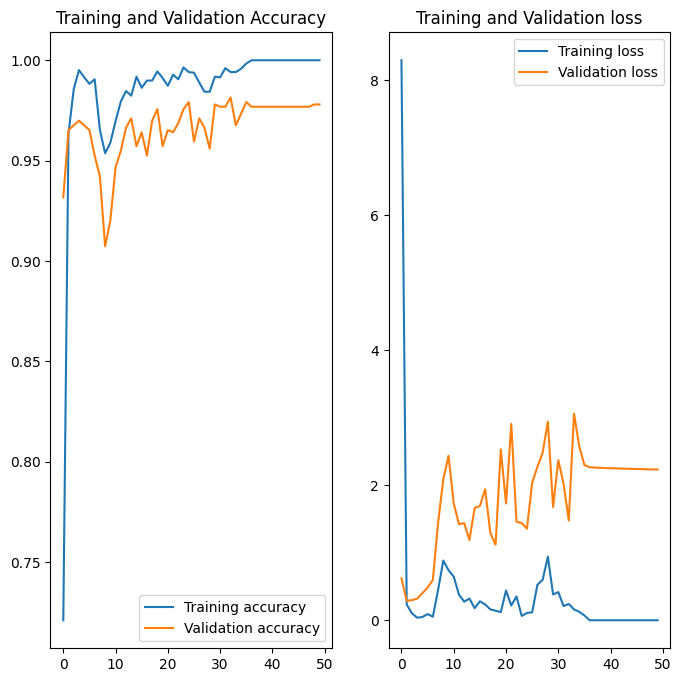

In [ ]:
EPOCHS=50
plt.figure(figsize=(8,8))
plt.subplot(1,2,1)
plt.plot(range(EPOCHS), acc, label='Training accuracy')
plt.plot(range(EPOCHS), vali_acc, label='Validation accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1,2,2)
plt.plot(range(EPOCHS), loss, label='Training loss')
plt.plot(range(EPOCHS), vali_loss, label='Validation loss')
plt.legend(loc='upper right')
plt.title('Training and Validation loss')

first image to predict
actual label:  tenniscourt
1/1 [==============================] - 0s 37ms/step
predicted label: tenniscourt


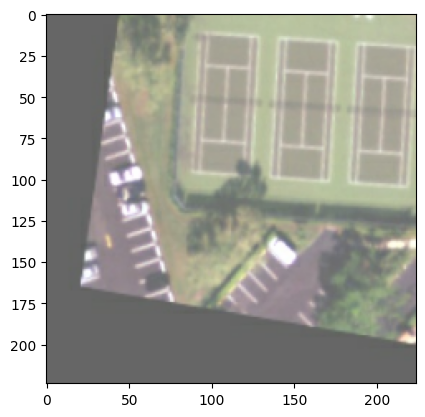

In [ ]:
for images_batch, labels_batch in test_data_s.take(1):

    first_image = images_batch[0].numpy().astype('uint8')
    first_label= labels_batch [0].numpy()

    print("first image to predict")
    plt.imshow(first_image)

    print("actual label: ",landuse_class_names[first_label])
    batch_prediction=model.predict(images_batch)
    print("predicted label:",landuse_class_names[numpy.argmax(batch_prediction[0])])

In [ ]:
def predict(model, img):

    img_array = tf.keras.preprocessing.image.img_to_array(images[i].numpy())
    img_array = tf.expand_dims(img_array, 0) # Create a batch

    predictions=model.predict(img_array)

    predicted_class= landuse_class_names[numpy.argmax(predictions[0])]
    confidence = round(100*(numpy.max(predictions[0])), 2)

    return predicted_class, confidence

1/1 [==============================] - 0s 20ms/step


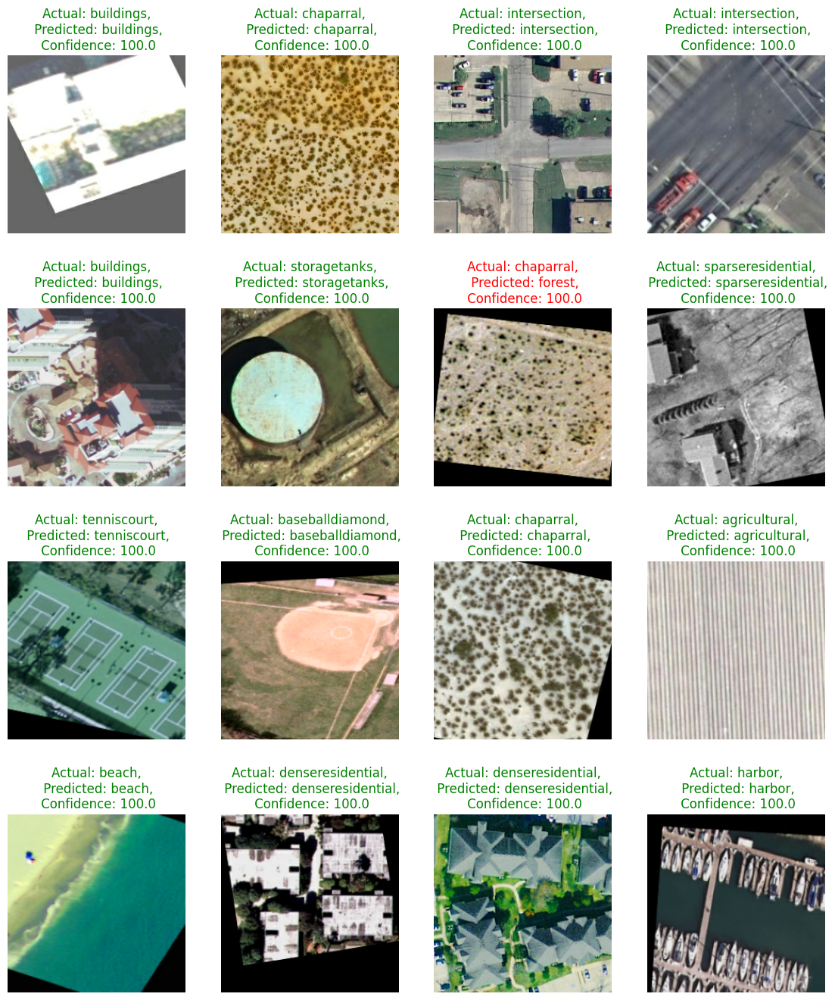

In [ ]:
plt.figure(figsize=(16, 16))
for images, labels in test_data_s.take(1):

    for i in range(16) :

        ax = plt.subplot(4, 4, i+1)
        plt.subplots_adjust(bottom=0.1, right=0.8, top=0.9)
        plt.imshow(images[i].numpy().astype("uint8"))
        predicted_class, confidence = predict(model, images[i].numpy())
        actual_class= landuse_class_names[labels[i]]

        # plt.title(f"Actual: {actual_class},\n Predicted: {predicted_class},\n Confidence: {confidence}")
        if actual_class == predicted_class:
            plt.title(f"Actual: {actual_class},\n Predicted: {predicted_class},\n Confidence: {confidence}", color='green')
        else:
            plt.title(f"Actual: {actual_class},\n Predicted: {predicted_class},\n Confidence: {confidence}", color='red')

        plt.axis("off")

In [ ]:
!pip install seaborn

1/1 [==============================] - 0s 25ms/step


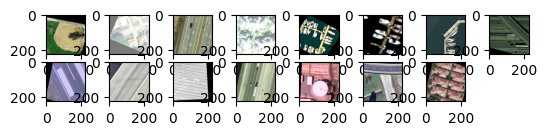

In [ ]:
y_pred = []
y_true = []
for images, labels in test_data_s:

    for i in range(len(test_data_s)) :

        ax = plt.subplot(8, 8, i+1)
        plt.imshow(images[i].numpy().astype("uint8"))
        predicted_class, confidence = predict(model, images[i].numpy())
        actual_class=landuse_class_names[labels[i]]
        y_pred.append(predicted_class)
        y_true.append(actual_class)

In [ ]:
y_true

['agricultural',
 'buildings',
 'overpass',
 'overpass',
 'intersection',
 'baseballdiamond',
 'storagetanks',
 'mobilehomepark',
 'intersection',
 'mobilehomepark',
 'buildings',
 'freeway',
 'parkinglot',
 'storagetanks',
 'storagetanks',
 'denseresidential',
 'runway',
 'river',
 'forest',
 'buildings',
 'runway',
 'runway',
 'harbor',
 'forest',
 'agricultural',
 'baseballdiamond',
 'overpass',
 'forest',
 'parkinglot',
 'mobilehomepark',
 'parkinglot',
 'river',
 'chaparral',
 'denseresidential',
 'chaparral',
 'chaparral',
 'overpass',
 'mobilehomepark',
 'freeway',
 'beach',
 'storagetanks',
 'chaparral',
 'forest',
 'agricultural',
 'forest',
 'runway',
 'parkinglot',
 'river',
 'storagetanks',
 'forest',
 'agricultural',
 'overpass',
 'baseballdiamond',
 'parkinglot',
 'buildings',
 'beach',
 'runway',
 'parkinglot',
 'forest',
 'airplane',
 'sparseresidential',
 'freeway',
 'forest',
 'runway',
 'chaparral',
 'forest',
 'denseresidential',
 'river',
 'freeway',
 'golfcourse',

In [ ]:
y_pred

['agricultural',
 'buildings',
 'overpass',
 'overpass',
 'intersection',
 'baseballdiamond',
 'storagetanks',
 'mobilehomepark',
 'intersection',
 'mobilehomepark',
 'mobilehomepark',
 'freeway',
 'parkinglot',
 'storagetanks',
 'storagetanks',
 'denseresidential',
 'runway',
 'river',
 'forest',
 'buildings',
 'runway',
 'runway',
 'harbor',
 'forest',
 'agricultural',
 'baseballdiamond',
 'overpass',
 'forest',
 'parkinglot',
 'mobilehomepark',
 'parkinglot',
 'river',
 'chaparral',
 'mobilehomepark',
 'chaparral',
 'chaparral',
 'overpass',
 'mobilehomepark',
 'freeway',
 'beach',
 'storagetanks',
 'chaparral',
 'forest',
 'agricultural',
 'forest',
 'runway',
 'parkinglot',
 'river',
 'storagetanks',
 'forest',
 'agricultural',
 'overpass',
 'baseballdiamond',
 'parkinglot',
 'buildings',
 'beach',
 'runway',
 'parkinglot',
 'forest',
 'airplane',
 'sparseresidential',
 'freeway',
 'forest',
 'runway',
 'chaparral',
 'forest',
 'denseresidential',
 'river',
 'freeway',
 'golfcours

Text(50.72222222222221, 0.5, 'True labels')

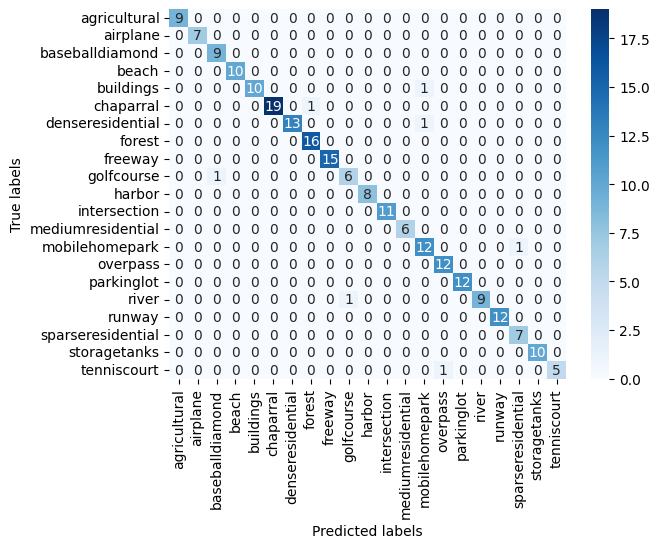

In [ ]:
# confusion matrix

from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# assume y_true and y_pred are the true labels and predicted labels, respectively
cm = confusion_matrix(y_true, y_pred)

# define class names
landuse_class_names =['agricultural',
 'airplane',
 'baseballdiamond',
 'beach',
 'buildings',
 'chaparral',
 'denseresidential',
 'forest',
 'freeway',
 'golfcourse',
 'harbor',
 'intersection',
 'mediumresidential',
 'mobilehomepark',
 'overpass',
 'parkinglot',
 'river',
 'runway',
 'sparseresidential',
 'storagetanks',
 'tenniscourt']
# create heatmap with labeled axes
sns.heatmap(cm, annot=True, fmt='g', cmap='Blues', xticklabels=class_names, yticklabels=class_names)

# set labels
plt.xlabel('Predicted labels')
plt.ylabel('True labels')


In [ ]:
cm

array([[ 9,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  0,  0],
       [ 0,  7,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  0,  0],
       [ 0,  0,  9,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  0,  0],
       [ 0,  0,  0, 10,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  0,  0],
       [ 0,  0,  0,  0, 10,  0,  0,  0,  0,  0,  0,  0,  0,  1,  0,  0,
         0,  0,  0,  0,  0],
       [ 0,  0,  0,  0,  0, 19,  0,  1,  0,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  0,  0],
       [ 0,  0,  0,  0,  0,  0, 13,  0,  0,  0,  0,  0,  0,  1,  0,  0,
         0,  0,  0,  0,  0],
       [ 0,  0,  0,  0,  0,  0,  0, 16,  0,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  0,  0],
       [ 0,  0,  0,  0,  0,  0,  0,  0, 15,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  0,  0],
       [ 0,  0,  1,  0,  0,  0,  0,  0,  0,  6,  0,  0,  0,  0,  0,  0,
         0,  0,  0,

In [ ]:
num_classes = 21  # classes
precision = []
recall = []

for i in range(num_classes):
    tp = cm[i, i]  # True positives for class i
    fp = sum(cm[:, i]) - tp  # False positives for class i
    fn = sum(cm[i, :]) - tp  # False negatives for class i

    # Calculate precision (p) and recall (r) for class i
    p = tp / (tp + fp) if (tp + fp) > 0 else 0.0  # Handle division by zero
    r = tp / (tp + fn) if (tp + fn) > 0 else 0.0  # Handle division by zero

    # Append precision and recall to respective lists
    precision.append(p)
    recall.append(r)

print("Precision:", precision)
print("Recall:", recall)


Precision: [1.0, 1.0, 0.9, 1.0, 1.0, 1.0, 1.0, 0.9411764705882353, 1.0, 0.8571428571428571, 1.0, 1.0, 1.0, 0.8571428571428571, 0.9230769230769231, 1.0, 1.0, 1.0, 0.875, 1.0, 1.0]
Recall: [1.0, 1.0, 1.0, 1.0, 0.9090909090909091, 0.95, 0.9285714285714286, 1.0, 1.0, 0.8571428571428571, 1.0, 1.0, 1.0, 0.9230769230769231, 1.0, 1.0, 0.9, 1.0, 1.0, 1.0, 0.8333333333333334]


In [ ]:
# calculate precision and recall for each class
num_classes = 4
precision = []
recall = []
for i in range(num_classes):
    tp = cm[i, i]
    fp = sum(cm[:, i]) - tp
    fn = sum(cm[i, :]) - tp
    p = tp / (tp + fp)
    r = tp / (tp + fn)
    precision.append(p)
    recall.append(r)

print("Precision:", precision)
print("Recall:", recall)


Precision: [1.0, 1.0, 0.9, 1.0]
Recall: [1.0, 1.0, 1.0, 1.0]


In [ ]:
from sklearn.metrics import f1_score

# Calculate the F1 score
f1 = f1_score(y_true, y_pred, average='weighted')


In [ ]:
from sklearn.metrics import classification_report

# get the classification report, which includes F1 score for each class
report = classification_report(y_true, y_pred)

# print the classification report
print(report)


                   precision    recall  f1-score   support

     agricultural       1.00      1.00      1.00         9
         airplane       1.00      1.00      1.00         7
  baseballdiamond       0.90      1.00      0.95         9
            beach       1.00      1.00      1.00        10
        buildings       1.00      0.91      0.95        11
        chaparral       1.00      0.95      0.97        20
 denseresidential       1.00      0.93      0.96        14
           forest       0.94      1.00      0.97        16
          freeway       1.00      1.00      1.00        15
       golfcourse       0.86      0.86      0.86         7
           harbor       1.00      1.00      1.00         8
     intersection       1.00      1.00      1.00        11
mediumresidential       1.00      1.00      1.00         6
   mobilehomepark       0.86      0.92      0.89        13
         overpass       0.92      1.00      0.96        12
       parkinglot       1.00      1.00      1.00       

**SAVING MODEL**

In [ ]:
import os
from tensorflow.keras.models import load_model

# Assuming 'model' is your Keras model object
save_path = '/content/drive/MyDrive/VGG16/models/VGG16.h5'
model.save(save_path)

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


**EXPLAINABILITY FOR LIME**

In [ ]:
! pip install lime

In [ ]:
# import all of the necessary libraries
import lime
import numpy as np
from lime import lime_image
from skimage.segmentation import mark_boundaries
# generate the LIME explanation
explainer = lime_image.LimeImageExplainer()
# Define a predict_proba function for your model
def predict_proba(images):
    # Make predictions with your model
    preds = model.predict(images)
    # Return the predicted probabilities
    return preds

def my_explain_instance(image):
  # Generate an explanation for the test image
  explanation = explainer.explain_instance(
    image,
    predict_proba,
    top_labels=3,
    num_samples=1000,
    labels=(0, 1)
)
# Generate an explanation for the test image
explanation = explainer.explain_instance(
    first_image,
    predict_proba,
    top_labels=3,
    num_samples=1000,
    labels=(0, 1)
)

# Show the top labels for the test image
print('Top labels for test image:')
for label in explanation.top_labels:
    print(label)

# Show the explanation for the top label
print('Explanation for top label:')
temp, mask = explanation.get_image_and_mask(
    explanation.top_labels[0],
    positive_only=True,
    num_features=5,
    hide_rest=False
)


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 28ms/step
Top labels for test image:
20
9
1
Explanation for top label:


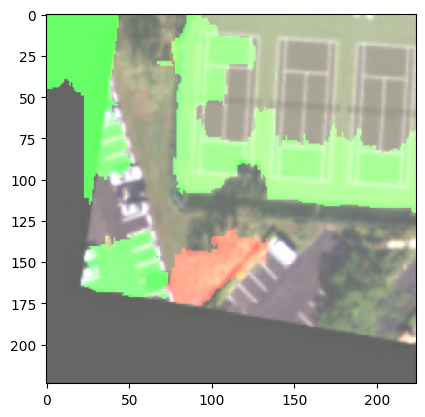

In [ ]:
# Visualize the resulting explanation
from lime import lime_image
from skimage.segmentation import mark_boundaries

# Get the image and explanation as numpy arrays
image, mask = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=False, num_features=10, hide_rest=False)
plt.imshow(image)

**SHAPLEY ADDIDITIVE EXPLAINABLILITY**

In [ ]:
!pip install shap

In [ ]:
import matplotlib.pyplot as plt
import tensorflow as tf

def get_image_for_prediction(dataset, class_names, image_size=(250, 250)):
    # Get the first image and label from the dataset
    for images_batch, labels_batch in dataset.take(1):
        first_image = images_batch[0].numpy().astype('uint8')
        first_label = labels_batch[0].numpy()

        # Display the image and print the actual label
        plt.imshow(first_image)
        plt.show()
        print("Actual label:", class_names[first_label])

        # Preprocess the image for model input
        image = tf.image.convert_image_dtype(first_image, tf.float32)
        image = tf.image.resize_with_pad(image, target_height=image_size[0], target_width=image_size[1])
        image = tf.expand_dims(image, axis=0)  # Add batch dimension

        return image



Image to predict: 1


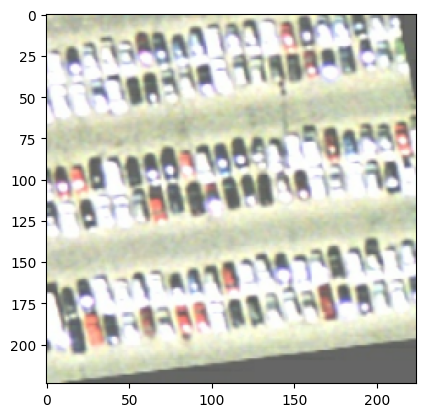

Actual label: parkinglot
1/1 [==============================] - 0s 129ms/step
Predicted label: parkinglot
Image to predict: 2


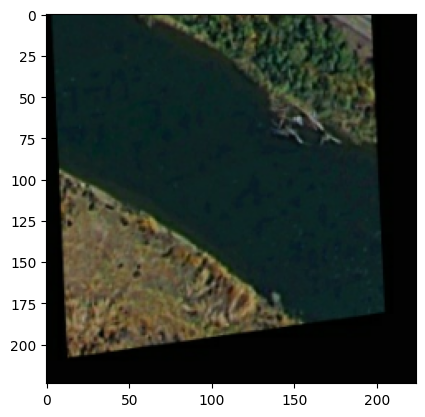

Actual label: river
1/1 [==============================] - 0s 83ms/step
Predicted label: river
Image to predict: 3


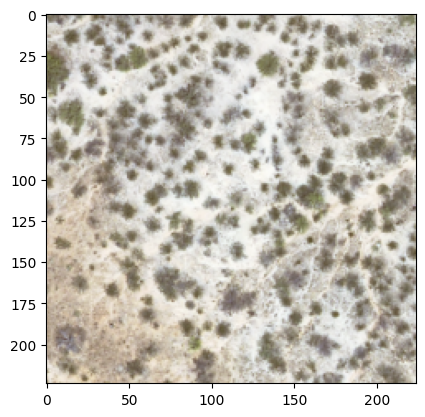

Actual label: chaparral
1/1 [==============================] - 0s 92ms/step
Predicted label: chaparral
Image to predict: 4


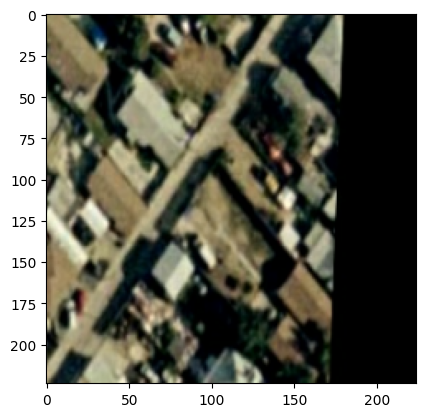

Actual label: denseresidential
1/1 [==============================] - 0s 65ms/step
Predicted label: mobilehomepark
Image to predict: 5


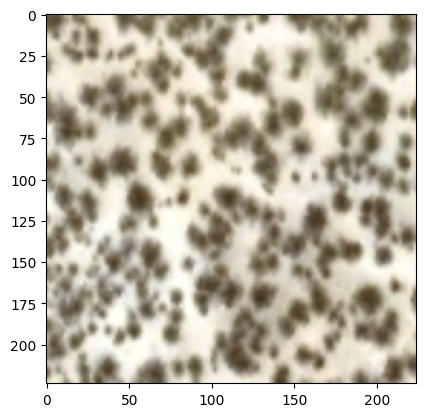

Actual label: chaparral
1/1 [==============================] - 0s 28ms/step
Predicted label: chaparral
Image to predict: 6


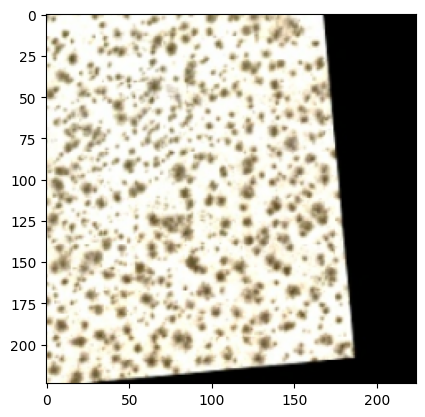

Actual label: chaparral
1/1 [==============================] - 0s 35ms/step
Predicted label: chaparral
Image to predict: 7


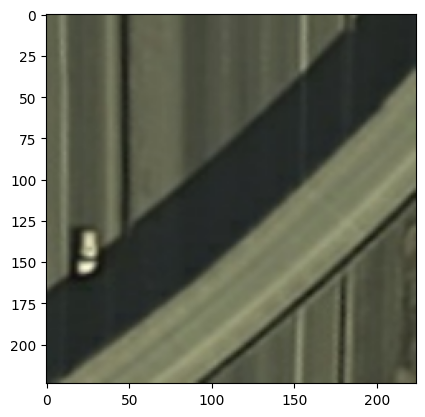

Actual label: overpass
1/1 [==============================] - 0s 87ms/step
Predicted label: overpass
Image to predict: 8


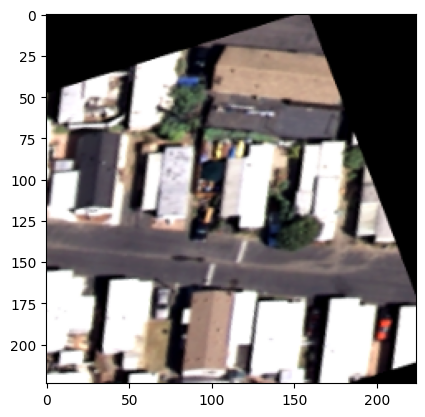

Actual label: mobilehomepark
1/1 [==============================] - 0s 26ms/step
Predicted label: mobilehomepark
Image to predict: 9


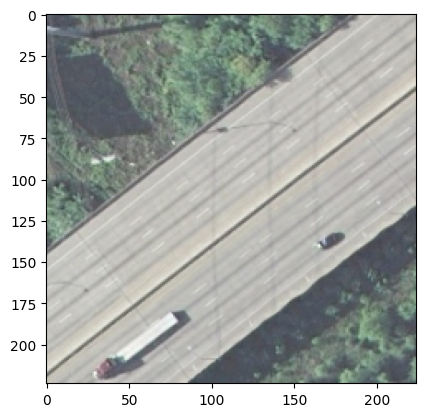

Actual label: freeway
1/1 [==============================] - 0s 35ms/step
Predicted label: freeway
Image to predict: 10


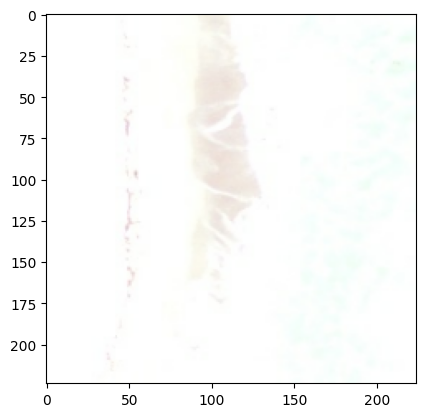

Actual label: beach
1/1 [==============================] - 0s 39ms/step
Predicted label: beach
Image to predict: 11


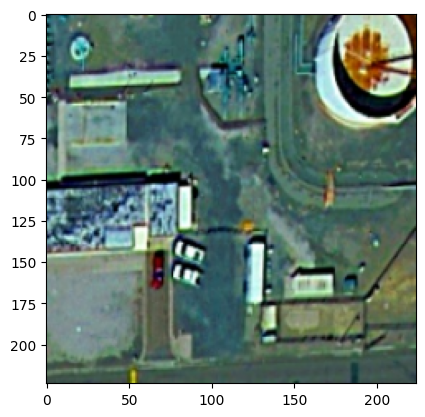

Actual label: storagetanks
1/1 [==============================] - 0s 63ms/step
Predicted label: storagetanks
Image to predict: 12


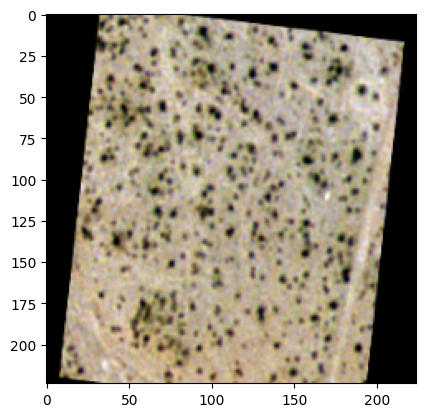

Actual label: chaparral
1/1 [==============================] - 0s 29ms/step
Predicted label: chaparral
Image to predict: 13


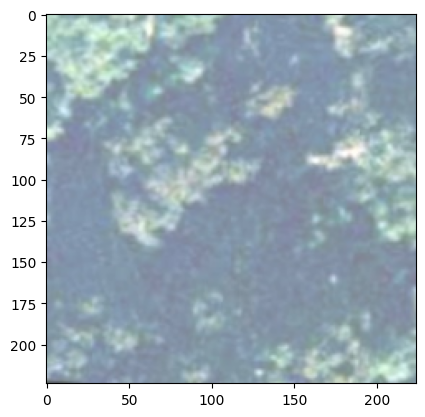

Actual label: forest
1/1 [==============================] - 0s 48ms/step
Predicted label: forest
Image to predict: 14


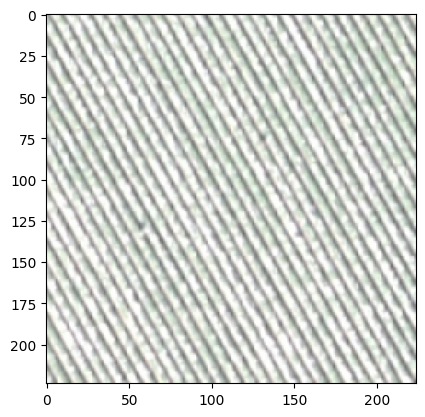

Actual label: agricultural
1/1 [==============================] - 0s 43ms/step
Predicted label: agricultural
Image to predict: 15


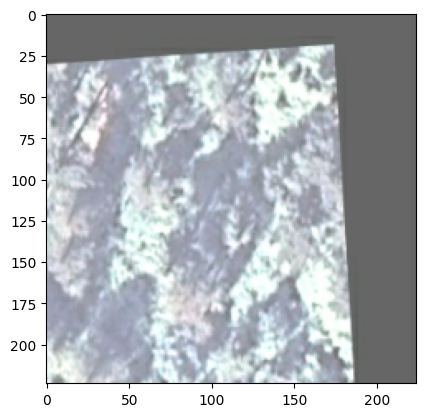

Actual label: forest
1/1 [==============================] - 0s 82ms/step
Predicted label: forest
Image to predict: 16


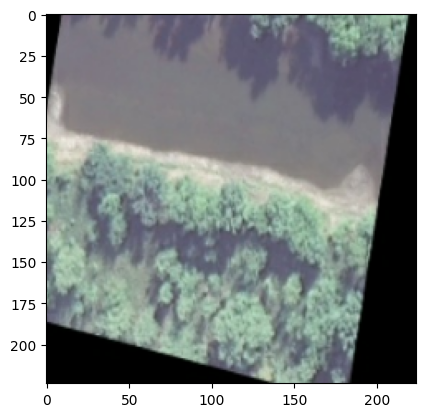

Actual label: river
1/1 [==============================] - 0s 49ms/step
Predicted label: river
Image to predict: 17


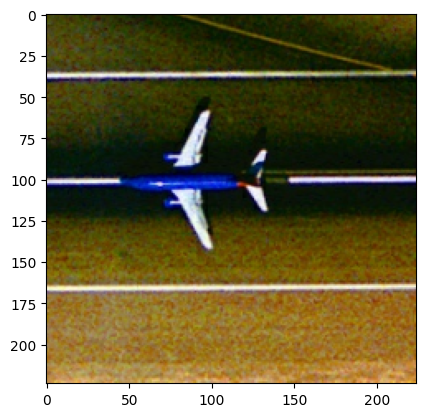

Actual label: airplane
1/1 [==============================] - 0s 108ms/step
Predicted label: airplane
Image to predict: 18


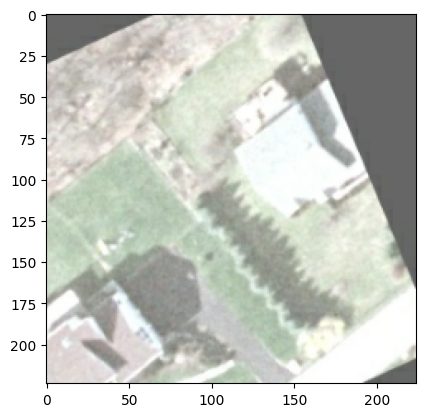

Actual label: sparseresidential
1/1 [==============================] - 0s 63ms/step
Predicted label: sparseresidential
Image to predict: 19


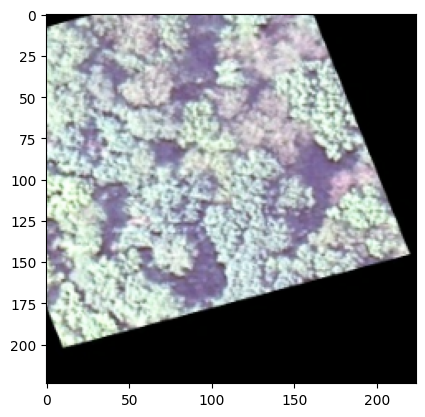

Actual label: forest
1/1 [==============================] - 0s 100ms/step
Predicted label: forest
Image to predict: 20


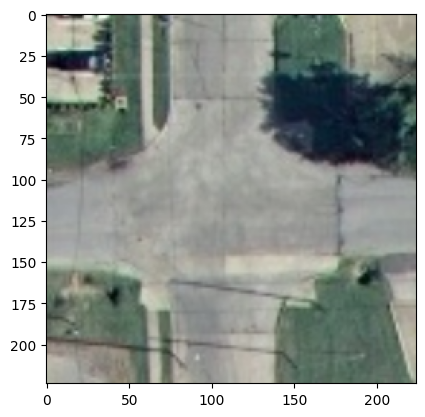

Actual label: intersection
1/1 [==============================] - 0s 74ms/step
Predicted label: intersection


In [ ]:
import matplotlib.pyplot as plt
import numpy as np

landuse_class_names = dataset.class_names

images_array = []  # Array to store the images

for images_batch, labels_batch in test_data_s.take(1):
    for i in range(20):  # Modify the range to specify the number of images you want
        image = images_batch[i].numpy().astype('uint8')
        label = labels_batch[i].numpy()

        print("Image to predict:", i+1)
        plt.imshow(image)
        plt.show()

        print("Actual label:", landuse_class_names[label])
        batch_prediction = model.predict(np.expand_dims(images_batch[i], axis=0))
        predicted_label = landuse_class_names[np.argmax(batch_prediction)]

        print("Predicted label:", predicted_label)
        images_array.append(image)

# images_array now contains the array of 5 images


In [ ]:
import shap
shap.initjs()
print(first_image.shape)
masker = shap.maskers.Image("inpaint_telea", first_image.shape)

explainer = shap.Explainer(model, masker, output_names=landuse_class_names)

explainer

(224, 224, 3)


  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer:   5%|▌         | 1/20 [00:00<?, ?it/s]

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer:  15%|█▌        | 3/20 [01:05<04:20, 15.30s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer:  20%|██        | 4/20 [01:23<04:23, 16.47s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer:  25%|██▌       | 5/20 [01:39<04:03, 16.20s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer:  30%|███       | 6/20 [01:58<03:59, 17.10s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer:  35%|███▌      | 7/20 [02:16<03:47, 17.48s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer:  40%|████      | 8/20 [02:40<03:53, 19.49s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer:  45%|████▌     | 9/20 [03:00<03:36, 19.64s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer:  50%|█████     | 10/20 [03:21<03:21, 20.13s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer:  55%|█████▌    | 11/20 [03:44<03:08, 20.98s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer:  60%|██████    | 12/20 [04:10<03:01, 22.64s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer:  65%|██████▌   | 13/20 [04:29<02:30, 21.46s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer:  70%|███████   | 14/20 [04:52<02:11, 21.97s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer:  75%|███████▌  | 15/20 [05:18<01:55, 23.20s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer:  80%|████████  | 16/20 [05:37<01:27, 21.92s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer:  85%|████████▌ | 17/20 [05:59<01:05, 21.98s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer:  90%|█████████ | 18/20 [06:25<00:46, 23.10s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer:  95%|█████████▌| 19/20 [06:48<00:23, 23.18s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 100%|██████████| 20/20 [07:03<00:00, 20.72s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 21it [07:24, 22.24s/it]


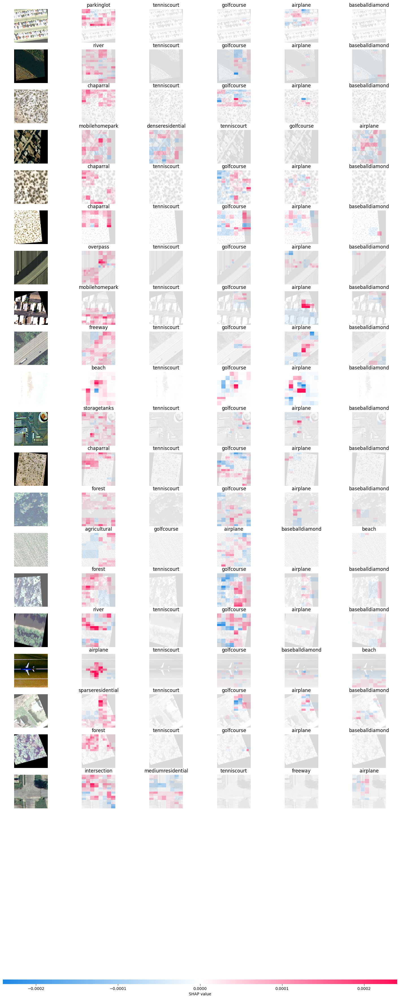

In [ ]:
import shap
# Convert the list of images to a numpy array
images_array = np.array(images_array)
shap_values = explainer(images_array, outputs=shap.Explanation.argsort.flip[:5])

shap_values.shape
shap.image_plot(shap_values)

**GRADCAM EXPLAINER**

In [ ]:
!pip install tensorflow matplotlib
!pip install gradcam
!pip install tf-explain



ERROR: Could not find a version that satisfies the requirement gradcam (from versions: none)
ERROR: No matching distribution found for gradcam


first image to predict
actual label:  baseballdiamond
1/1 [==============================] - 0s 29ms/step
predicted label: baseballdiamond


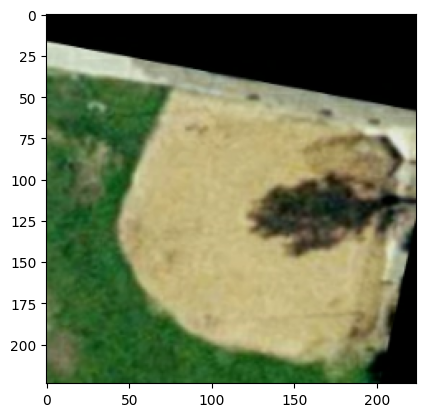

In [ ]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt


for images_batch, labels_batch in test_data_s.take(1):

    first_image = images_batch[0].numpy().astype('uint8')
    first_label= labels_batch [0].numpy()

    print("first image to predict")
    plt.imshow(first_image)

    print("actual label: ",landuse_class_names[first_label])
    batch_prediction=model.predict(images_batch)
    print("predicted label:",landuse_class_names[np.argmax(batch_prediction[0])])



def predict(model, img):

    img_array = tf.keras.preprocessing.image.img_to_array(images[i].numpy())
    img_array = tf.expand_dims(img_array, 0) # Create a batch

    predictions=model.predict(img_array)

    predicted_class= landuse_class_names[numpy.argmax(predictions[0])]
    confidence = round(100*(numpy.max(predictions[0])), 2)

    return predicted_class, confidence

In [ ]:


from tf_explain.core.grad_cam import GradCAM
# Load pretrained model or your own


# Load a sample image (or multiple ones)
# img = tf.keras.preprocessing.image.load_img(IMAGE_PATH, target_size=(224, 224))
img = tf.keras.preprocessing.image.img_to_array(first_image)
data = ([img], None)

# Start explainer
explainer = GradCAM()
grid = explainer.explain(data, model, class_index=first_label, layer_name="block5_conv3")  # 281 is the tabby cat index in ImageNet

explainer.save(grid, ".", "grad_cam.png")



**visualizing regions that contribute to the most specfic prediction**

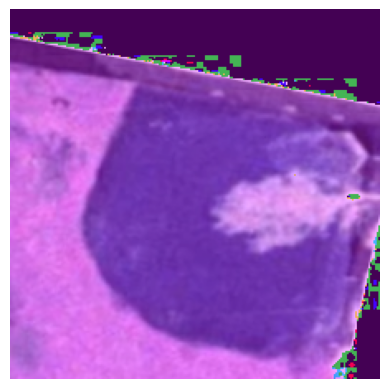

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Replace 'image_path' with the path to your saved GradCAM visualization image
image_path = "grad_cam.png"

# Load the image
img = mpimg.imread(image_path)

# Display the image
plt.imshow(img)
plt.axis('off')
plt.show()
